<div style="background: linear-gradient(135deg, #0f0c29, #302b63, #24243e); padding: 40px 30px; border-radius: 16px; margin-bottom: 20px;">
<h1 style="text-align:center; color:#00cec9; font-family:Verdana; letter-spacing:3px;">
 Image Matching Challenge 2024  EDA & CV Fundamentals
</h1>
<h4 style="text-align:center; color:#dfe6e9; font-family:Verdana;">
Notebook 1 of 2 ? Data Understanding & Computer Vision Techniques
</h4>
<hr style="border:1px solid #6c5ce7;">
<p style="color:#fab1a0; font-family:Verdana; font-size:14px; text-align:center;">
This notebook presents our end-to-end exploratory analysis for IMC 2024. We profile scene-level statistics, inspect covisibility behavior, and validate camera geometry before matching. The workflow is structured for direct Kaggle execution with reproducible setup, robust visual diagnostics, and implementation-ready CV foundations for downstream pose estimation.
</p>
</div>

## Table of Contents

1. [Environment Setup & Imports](#sec1)
2. [Dataset Overview & Loading](#sec2)
3. [Covisibility Deep-Dive ? Real Image Pairs](#sec4)
4. [Computer Vision Fundamentals](#sec5)
   - 4.1 Feature Detection ? SIFT
   - 4.2 Feature Detection ? ORB
   - 4.3 Feature Detection ? AKAZE
   - 4.4 Detector Comparison (Stats & Visuals)
   - 4.5 Feature Matching ? Brute-Force + Ratio Test
   - 4.6 RANSAC Filtering
   - 4.7 Baseline CV Parity Check (SIFT vs ORB)
5. [Camera Calibration, Stereo Vision & Depth](#sec6)
   - 5.1 Chessboard Calibration & Undistortion
   - 5.2 Stereo Disparity & Depth on IMC Pair
6. [Fundamental & Essential Matrices](#sec7)
   - 6.1 SIFT-Based Epipolar Geometry
   - 6.2 ORB + RANSAC Epipolar Geometry
7. [SfM Pipeline Overview & Key Takeaways](#sec8)


<a id="sec1"></a>
## 1 · Environment Setup & Imports

In [23]:
import os, gc, time, random, warnings, csv, math
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import ListedColormap
from PIL import Image
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore")

# Reproducibility
def seed_it_all(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
seed_it_all()

# Standard matplotlib style for Kaggle compatibility
plt.style.use('default')

DATA_DIR = os.getenv('IMC2024_DATA_DIR', '/kaggle/input/image-matching-challenge-2024')
TRAIN_DIR = os.path.join(DATA_DIR, 'train')

# Default pair from attached notebook (override via env if needed)
DEFAULT_SCENE = os.getenv('IMC2024_SCENE', 'church')
DEFAULT_IMG1 = os.getenv('IMC2024_IMG1', '00017')
DEFAULT_IMG2 = os.getenv('IMC2024_IMG2', '00020')

print(f'Data directory: {DATA_DIR}')
print(f'Train directory exists: {os.path.exists(TRAIN_DIR)}')
print(f'OpenCV version: {cv2.__version__}')
print(f'NumPy  version: {np.__version__}')

Data directory: /kaggle/input/image-matching-challenge-2024
Train directory exists: True
OpenCV version: 4.12.0
NumPy  version: 2.0.2


<a id="sec2"></a>
## 2 · Dataset Overview & Loading

In [24]:
# Discover train scenes for IMC2024 and build scene maps (robust to minor schema changes)
scaling_path = os.path.join(TRAIN_DIR, 'scaling_factors.csv')
if os.path.exists(scaling_path):
    scaling_df = pd.read_csv(scaling_path)
    TRAIN_SCENES = scaling_df['scene'].dropna().unique().tolist()
    scale_map = scaling_df.groupby('scene')['scaling_factor'].first().to_dict() if 'scaling_factor' in scaling_df.columns else {}
else:
    scaling_df = pd.DataFrame(columns=['scene', 'scaling_factor'])
    TRAIN_SCENES = sorted([
        d for d in os.listdir(TRAIN_DIR)
        if os.path.isdir(os.path.join(TRAIN_DIR, d)) and not d.startswith('.')
    ]) if os.path.exists(TRAIN_DIR) else []
    scale_map = {}

print(f'Found {len(TRAIN_SCENES)} scenes: {TRAIN_SCENES[:10]}{" ..." if len(TRAIN_SCENES) > 10 else ""}')

def _image_files(img_dir):
    exts = {'.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'}
    return sorted([
        os.path.join(img_dir, f) for f in os.listdir(img_dir)
        if os.path.splitext(f)[1] in exts
    ]) if os.path.exists(img_dir) else []

def _split_pair_col(pair_series):
    pairs = pair_series.astype(str).str.split('-', n=1, expand=True)
    if pairs.shape[1] < 2:
        return pd.Series(dtype=str), pd.Series(dtype=str)
    return pairs[0], pairs[1]

train_map = {}
for scene in tqdm(TRAIN_SCENES, desc='Loading scene metadata'):
    train_map[scene] = {}
    scene_dir = os.path.join(TRAIN_DIR, scene)
    img_dir = os.path.join(scene_dir, 'images')

    images = _image_files(img_dir)
    image_ids = [os.path.splitext(os.path.basename(p))[0] for p in images]
    id_to_path = {os.path.splitext(os.path.basename(p))[0]: p for p in images}

    train_map[scene]['images'] = images
    train_map[scene]['image_ids'] = image_ids
    train_map[scene]['id_to_path'] = id_to_path

    cal_path = os.path.join(scene_dir, 'calibration.csv')
    if os.path.exists(cal_path):
        cal_df = pd.read_csv(cal_path)
    else:
        cal_df = pd.DataFrame({'image_id': image_ids})

    if 'image_id' not in cal_df.columns:
        cal_df['image_id'] = image_ids[:len(cal_df)] if len(cal_df) else []

    cal_df['image_path'] = cal_df['image_id'].astype(str).map(id_to_path)
    train_map[scene]['cal_df'] = cal_df

    pco_path = os.path.join(scene_dir, 'pair_covisibility.csv')
    if os.path.exists(pco_path):
        pco = pd.read_csv(pco_path)
    else:
        pco = pd.DataFrame(columns=['image_id_1', 'image_id_2', 'covisibility'])

    if 'pair' in pco.columns and ('image_id_1' not in pco.columns or 'image_id_2' not in pco.columns):
        image_id_1, image_id_2 = _split_pair_col(pco['pair'])
        pco['image_id_1'] = image_id_1
        pco['image_id_2'] = image_id_2

    if 'image_id_1' not in pco.columns:
        pco['image_id_1'] = pd.Series(dtype=str)
    if 'image_id_2' not in pco.columns:
        pco['image_id_2'] = pd.Series(dtype=str)
    if 'covisibility' not in pco.columns:
        pco['covisibility'] = np.nan

    pco['image_path_1'] = pco['image_id_1'].astype(str).map(id_to_path)
    pco['image_path_2'] = pco['image_id_2'].astype(str).map(id_to_path)
    pco = pco.dropna(subset=['image_path_1', 'image_path_2']).reset_index(drop=True)
    train_map[scene]['pco_df'] = pco

print(f'All {len(TRAIN_SCENES)} scenes loaded.')

Found 7 scenes: ['church', 'dioscuri', 'lizard', 'multi-temporal-temple-baalshamin', 'pond', 'transp_obj_glass_cup', 'transp_obj_glass_cylinder']


Loading scene metadata:   0%|          | 0/7 [00:00<?, ?it/s]

All 7 scenes loaded.


In [25]:
# Combine into a single analysis DataFrame
_cal, _pco, _scene = [], [], []
for s in TRAIN_SCENES:
    m = train_map[s]
    if len(m['images']):
        _scene.append(pd.DataFrame({'scene': s, 'f_path': m['images']}))
    if isinstance(m['cal_df'], pd.DataFrame) and len(m['cal_df']):
        _cal.append(m['cal_df'])
    if isinstance(m['pco_df'], pd.DataFrame) and len(m['pco_df']):
        _pco.append(m['pco_df'])

train_df = pd.concat(_scene, ignore_index=True) if _scene else pd.DataFrame(columns=['scene', 'f_path'])
train_df['image_id'] = train_df['f_path'].apply(lambda x: os.path.splitext(os.path.basename(x))[0]) if len(train_df) else pd.Series(dtype=str)

all_cal = pd.concat(_cal, ignore_index=True) if _cal else pd.DataFrame(columns=['image_id'])
all_pco = pd.concat(_pco, ignore_index=True) if _pco else pd.DataFrame(columns=['image_id_1', 'image_id_2', 'covisibility'])

if len(train_df) and 'image_id' in all_cal.columns:
    merge_cols = ['image_id'] + [c for c in all_cal.columns if c != 'image_id']
    train_df = train_df.merge(all_cal[merge_cols], on='image_id', how='left')

if 'image_path' in train_df.columns:
    train_df = train_df.drop(columns=['image_path'])

# Add mean covisibility per image when available
if len(all_pco):
    cov = pd.concat([
        all_pco[['image_id_1', 'covisibility']].rename(columns={'image_id_1': 'image_id'}),
        all_pco[['image_id_2', 'covisibility']].rename(columns={'image_id_2': 'image_id'})
    ], ignore_index=True)
    img_cov = cov.groupby('image_id')['covisibility'].mean().to_dict()
    train_df['mean_covisibility'] = train_df['image_id'].map(img_cov)
else:
    train_df['mean_covisibility'] = np.nan

def _parse_flat_value(s, idx, default=np.nan):
    try:
        vals = str(s).replace(',', ' ').split()
        return float(vals[idx]) if idx < len(vals) else default
    except Exception:
        return default

# Parse intrinsics if present
if 'camera_intrinsics' in train_df.columns:
    train_df['fx'] = train_df['camera_intrinsics'].apply(lambda x: _parse_flat_value(x, 0))
    train_df['fy'] = train_df['camera_intrinsics'].apply(lambda x: _parse_flat_value(x, 4))
    train_df['x0'] = train_df['camera_intrinsics'].apply(lambda x: _parse_flat_value(x, 2))
    train_df['y0'] = train_df['camera_intrinsics'].apply(lambda x: _parse_flat_value(x, 5))
    train_df['s'] = train_df['camera_intrinsics'].apply(lambda x: _parse_flat_value(x, 1))
else:
    for c in ['fx', 'fy', 'x0', 'y0', 's']:
        train_df[c] = np.nan

# Parse translation if present
if 'translation_vector' in train_df.columns:
    for i, name in enumerate(['t_x', 't_y', 't_z']):
        train_df[name] = train_df['translation_vector'].apply(lambda x, idx=i: _parse_flat_value(x, idx))
else:
    for c in ['t_x', 't_y', 't_z']:
        train_df[c] = np.nan

print(f'Combined DataFrame shape: {train_df.shape}')
print('Columns:', sorted(train_df.columns.tolist())[:20], '...')
print(f'Has covisibility pairs: {len(all_pco) > 0}')
train_df.head()

Combined DataFrame shape: (4105, 12)
Columns: ['f_path', 'fx', 'fy', 'image_id', 'mean_covisibility', 's', 'scene', 't_x', 't_y', 't_z', 'x0', 'y0'] ...
Has covisibility pairs: False


,scene,f_path,image_id,mean_covisibility,fx,fy,x0,y0,s,t_x,t_y,t_z
0,church,/kaggle/input/image-matching-challenge-2024/tr...,00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,church,/kaggle/input/image-matching-challenge-2024/tr...,00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,church,/kaggle/input/image-matching-challenge-2024/tr...,00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,church,/kaggle/input/image-matching-challenge-2024/tr...,00002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,church,/kaggle/input/image-matching-challenge-2024/tr...,00002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Helper Functions

In [26]:
def arr_from_str(s):
    vals = np.fromstring(str(s), sep=' ')
    if vals.size == 9:
        return vals.reshape(3, 3)
    if vals.size == 3:
        return vals
    return vals

def plot_image_pair(path1, path2, titles=None, figsize=(20, 8)):
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    for ax, p, t in zip(axes, [path1, path2], titles or [path1, path2]):
        img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(t, fontweight='bold', fontsize=12, color='#00cec9')
        ax.axis('off')
    fig.patch.set_facecolor('#1a1a2e')
    plt.tight_layout()
    plt.show()

def build_id2cal(train_map, scenes):
    m = {}
    for s in scenes:
        cal_df = train_map[s]['cal_df']
        for _, r in cal_df.iterrows():
            iid = str(r.get('image_id', ''))
            if not iid:
                continue
            m[iid] = {}
            m[iid]['K'] = arr_from_str(r.get('camera_intrinsics', '')) if 'camera_intrinsics' in cal_df.columns else None
            m[iid]['R'] = arr_from_str(r.get('rotation_matrix', '')) if 'rotation_matrix' in cal_df.columns else None
            m[iid]['T'] = arr_from_str(r.get('translation_vector', '')) if 'translation_vector' in cal_df.columns else None
            m[iid]['path'] = r.get('image_path', train_map[s]['id_to_path'].get(iid))
    return m

def choose_demo_pair(preferred_scene=None, require_pco=True):
    scenes = [preferred_scene] + [s for s in TRAIN_SCENES if s != preferred_scene] if preferred_scene else list(TRAIN_SCENES)
    for scene in scenes:
        if scene not in train_map:
            continue
        pco_df = train_map[scene]['pco_df']
        if require_pco and isinstance(pco_df, pd.DataFrame) and len(pco_df):
            row = pco_df.sort_values('covisibility', ascending=False).iloc[0]
            return scene, row['image_path_1'], row['image_path_2'], float(row.get('covisibility', np.nan))
        imgs = train_map[scene]['images']
        if len(imgs) >= 2:
            return scene, imgs[0], imgs[1], np.nan
    return None, None, None, np.nan

id2cal = build_id2cal(train_map, TRAIN_SCENES)
print(f'Calibration map built for {len(id2cal)} images')

Calibration map built for 1363 images


<a id="sec4"></a>
## 3 · Covisibility Deep-Dive — Real Image Pairs

Visualising high and low covisibility pairs from real dataset images.

In [27]:
# High and low covisibility examples from an available scene
scene_for_examples = None
for s in TRAIN_SCENES:
    pco = train_map[s]['pco_df']
    if len(pco):
        scene_for_examples = s
        break

if scene_for_examples is None:
    print('No pair_covisibility data found; skipping high/low covisibility examples.')
else:
    pco = train_map[scene_for_examples]['pco_df']
    high_row = pco.sort_values('covisibility', ascending=False).iloc[0]
    print(f"HIGH covisibility = {high_row.covisibility:.4f} ('{scene_for_examples}')")
    plot_image_pair(high_row.image_path_1, high_row.image_path_2,
        [f"Image 1 - COV={high_row.covisibility:.4f}", f"Image 2 - COV={high_row.covisibility:.4f}"])

    low_row = pco.sort_values('covisibility', ascending=True).iloc[0]
    print(f"LOW covisibility = {low_row.covisibility:.4f} ('{scene_for_examples}')")
    plot_image_pair(low_row.image_path_1, low_row.image_path_2,
        [f"Image 1 - COV={low_row.covisibility:.4f}", f"Image 2 - COV={low_row.covisibility:.4f}"])

No pair_covisibility data found; skipping high/low covisibility examples.


In [28]:
# One random pair per scene (only for scenes that contain pair_covisibility data)
print('Random image pairs across scenes:')
for scene in TRAIN_SCENES:
    pco_df = train_map[scene]['pco_df']
    if len(pco_df) == 0:
        continue
    row = pco_df.sample(1, random_state=42).iloc[0]
    plot_image_pair(row.image_path_1, row.image_path_2,
        [f"{scene} - Img1 ? COV={row.covisibility:.3f}", f"{scene} - Img2 ? COV={row.covisibility:.3f}"])

Random image pairs across scenes:


<a id="sec5"></a>
## 4 · Computer Vision Fundamentals

### 4.1 Feature Detection — SIFT

Scene used: church
Image 1: /kaggle/input/image-matching-challenge-2024/train/church/images/00017.png
Image 2: /kaggle/input/image-matching-challenge-2024/train/church/images/00020.png


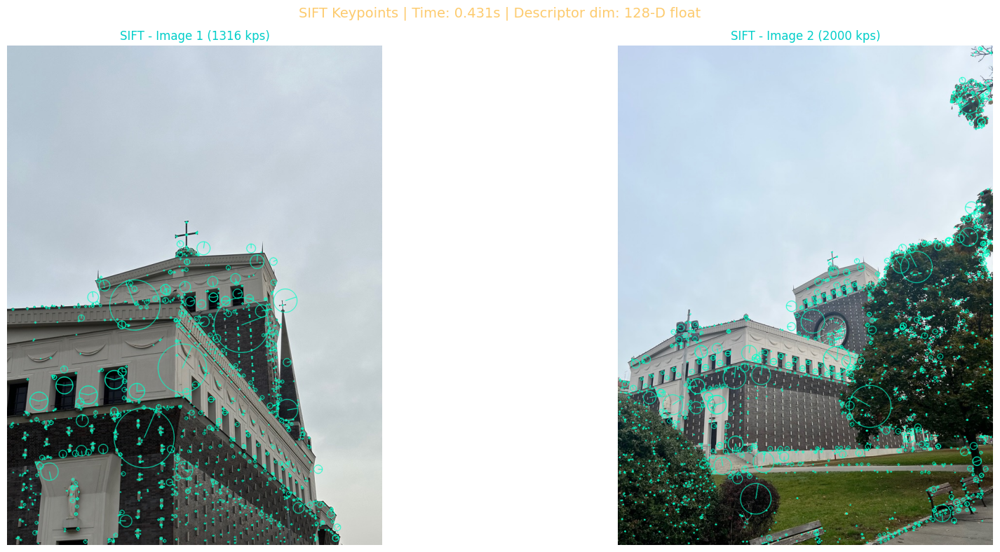

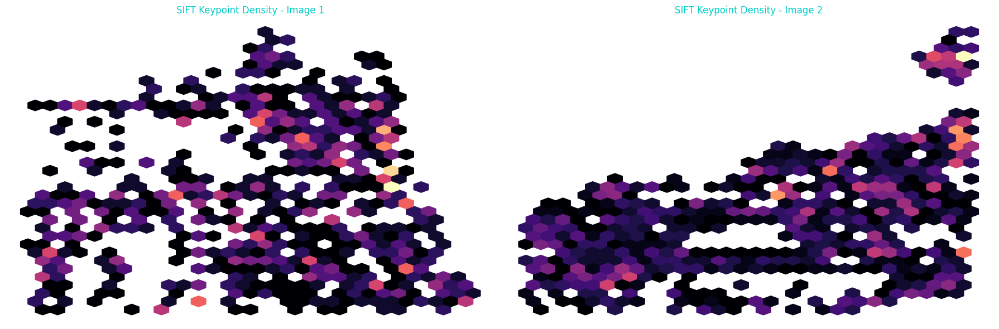

SIFT Statistics:
   Image 1: 1316 keypoints
   Image 2: 2000 keypoints
   Descriptor shape: (1316, 128)
   Detection time: 0.4310s
   Keypoint response - mean: 0.0304, max: 0.1103


In [29]:
# Use IMC2024 pair (defaulting to attached notebook scene/images) with automatic fallback
preferred_scene = DEFAULT_SCENE if DEFAULT_SCENE in train_map else None
scene, auto_path1, auto_path2, auto_cov = choose_demo_pair(preferred_scene=preferred_scene, require_pco=False)

# Try exact attached notebook filenames first, then fallback
candidate_dir = os.path.join(TRAIN_DIR, DEFAULT_SCENE, 'images')
exts = ['.png', '.jpg', '.jpeg', '.PNG', '.JPG', '.JPEG']

def _first_existing(base_id):
    for ext in exts:
        p = os.path.join(candidate_dir, f'{base_id}{ext}')
        if os.path.exists(p):
            return p
    return None

attached_p1 = _first_existing(DEFAULT_IMG1)
attached_p2 = _first_existing(DEFAULT_IMG2)

IMG1_PATH = attached_p1 if attached_p1 else auto_path1
IMG2_PATH = attached_p2 if attached_p2 else auto_path2

if IMG1_PATH is None or IMG2_PATH is None:
    raise RuntimeError('Could not find a valid image pair in IMC2024 train set.')

img1_gray = cv2.imread(IMG1_PATH, cv2.IMREAD_GRAYSCALE)
img2_gray = cv2.imread(IMG2_PATH, cv2.IMREAD_GRAYSCALE)
img1_rgb = cv2.cvtColor(cv2.imread(IMG1_PATH), cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(cv2.imread(IMG2_PATH), cv2.COLOR_BGR2RGB)

print('Scene used:', scene if scene else DEFAULT_SCENE)
print('Image 1:', IMG1_PATH)
print('Image 2:', IMG2_PATH)
if not np.isnan(auto_cov):
    print(f'Pair covisibility: {auto_cov:.4f}')

# SIFT detection
sift = cv2.SIFT_create(nfeatures=2000)
t0 = time.time()
kp1_sift, des1_sift = sift.detectAndCompute(img1_gray, None)
kp2_sift, des2_sift = sift.detectAndCompute(img2_gray, None)
sift_time = time.time() - t0

# Draw rich keypoints
sift_vis1 = cv2.drawKeypoints(img1_rgb, kp1_sift, None, color=(0, 255, 200), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
sift_vis2 = cv2.drawKeypoints(img2_rgb, kp2_sift, None, color=(0, 255, 200), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(sift_vis1)
axes[0].set_title(f'SIFT - Image 1 ({len(kp1_sift)} kps)', color='#00cec9')
axes[1].imshow(sift_vis2)
axes[1].set_title(f'SIFT - Image 2 ({len(kp2_sift)} kps)', color='#00cec9')
for ax in axes:
    ax.axis('off')
fig.suptitle(f'SIFT Keypoints | Time: {sift_time:.3f}s | Descriptor dim: 128-D float', fontsize=14, color='#fdcb6e')
plt.tight_layout()
plt.show()

# Keypoint heatmap
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for ax, kps, title in zip(axes, [kp1_sift, kp2_sift], ['Image 1', 'Image 2']):
    x = [k.pt[0] for k in kps]
    y = [k.pt[1] for k in kps]
    ax.hexbin(x, y, gridsize=30, cmap='magma', mincnt=1)
    ax.set_title(f'SIFT Keypoint Density - {title}', color='#00cec9')
    ax.invert_yaxis()
    ax.axis('off')
plt.tight_layout()
plt.show()

print('SIFT Statistics:')
print(f'   Image 1: {len(kp1_sift)} keypoints')
print(f'   Image 2: {len(kp2_sift)} keypoints')
print(f'   Descriptor shape: {des1_sift.shape}')
print(f'   Detection time: {sift_time:.4f}s')
responses1 = [k.response for k in kp1_sift]
print(f'   Keypoint response - mean: {np.mean(responses1):.4f}, max: {np.max(responses1):.4f}')

### 4.2 Feature Detection — ORB

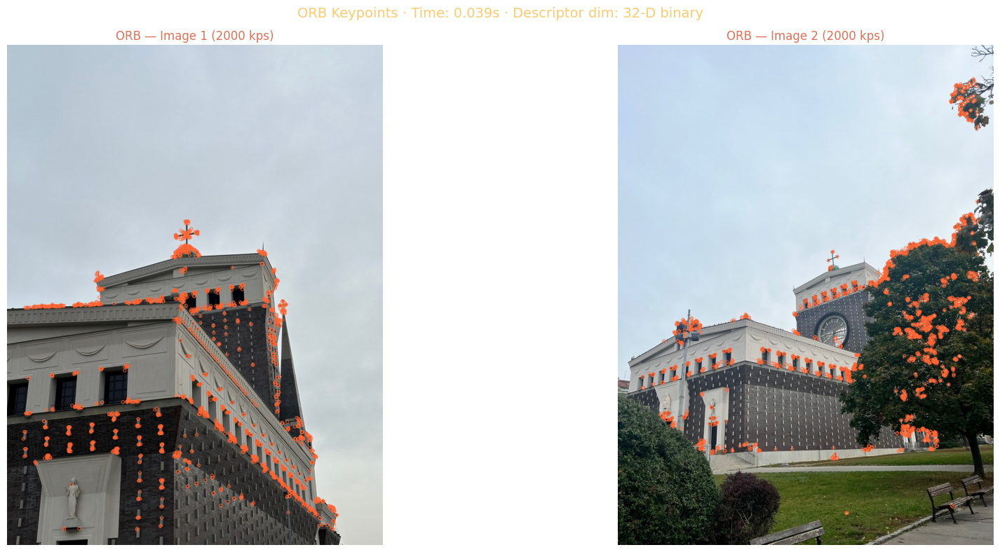

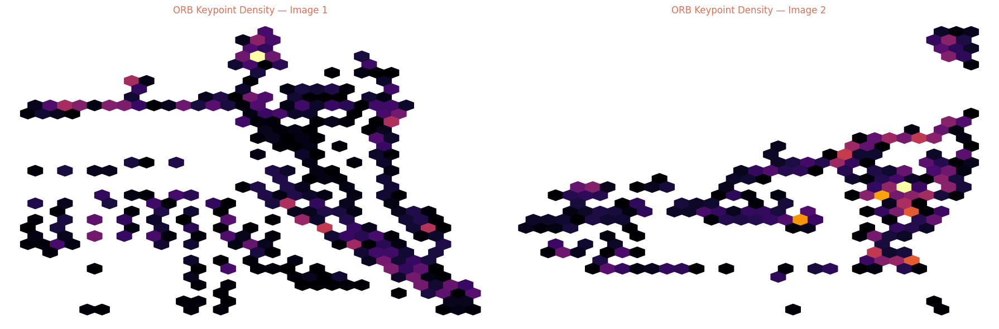


📊 ORB Statistics:
   Image 1: 2000 keypoints
   Image 2: 2000 keypoints
   Descriptor shape: (2000, 32)
   Detection time: 0.0391s


In [30]:
orb = cv2.ORB_create(nfeatures=2000)
t0 = time.time()
kp1_orb, des1_orb = orb.detectAndCompute(img1_gray, None)
kp2_orb, des2_orb = orb.detectAndCompute(img2_gray, None)
orb_time = time.time() - t0

orb_vis1 = cv2.drawKeypoints(img1_rgb, kp1_orb, None, color=(255,100,50), flags=0)
orb_vis2 = cv2.drawKeypoints(img2_rgb, kp2_orb, None, color=(255,100,50), flags=0)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(orb_vis1); axes[0].set_title(f"ORB — Image 1 ({len(kp1_orb)} kps)", color="#e17055")
axes[1].imshow(orb_vis2); axes[1].set_title(f"ORB — Image 2 ({len(kp2_orb)} kps)", color="#e17055")
for ax in axes: ax.axis("off")
fig.suptitle(f"ORB Keypoints · Time: {orb_time:.3f}s · Descriptor dim: 32-D binary",
             fontsize=14, color="#fdcb6e")
plt.tight_layout(); plt.show()

# Heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for ax, kps, title in zip(axes, [kp1_orb, kp2_orb], ["Image 1","Image 2"]):
    x = [k.pt[0] for k in kps]; y = [k.pt[1] for k in kps]
    ax.hexbin(x, y, gridsize=30, cmap='inferno', mincnt=1)
    ax.set_title(f"ORB Keypoint Density — {title}", color="#e17055")
    ax.invert_yaxis(); ax.axis("off")
plt.tight_layout(); plt.show()

print(f"\n📊 ORB Statistics:")
print(f"   Image 1: {len(kp1_orb)} keypoints")
print(f"   Image 2: {len(kp2_orb)} keypoints")
print(f"   Descriptor shape: {des1_orb.shape}")
print(f"   Detection time: {orb_time:.4f}s")

### 4.3 Feature Detection — AKAZE

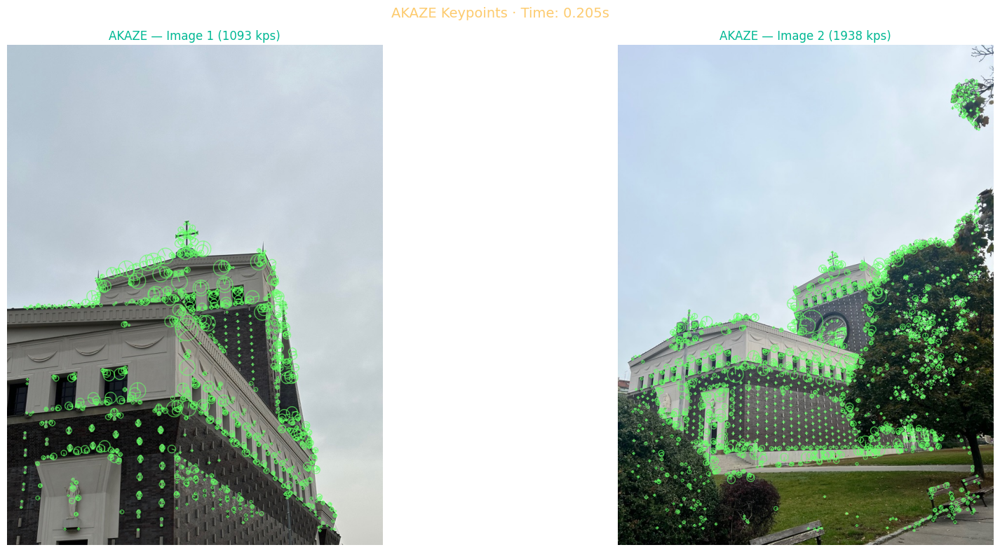


📊 AKAZE Statistics:
   Image 1: 1093 keypoints, desc shape: (1093, 61)
   Image 2: 1938 keypoints
   Detection time: 0.2049s


In [31]:
akaze = cv2.AKAZE_create()
t0 = time.time()
kp1_ak, des1_ak = akaze.detectAndCompute(img1_gray, None)
kp2_ak, des2_ak = akaze.detectAndCompute(img2_gray, None)
akaze_time = time.time() - t0

ak_vis1 = cv2.drawKeypoints(img1_rgb, kp1_ak, None, color=(100,255,100),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
ak_vis2 = cv2.drawKeypoints(img2_rgb, kp2_ak, None, color=(100,255,100),
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
axes[0].imshow(ak_vis1); axes[0].set_title(f"AKAZE — Image 1 ({len(kp1_ak)} kps)", color="#00b894")
axes[1].imshow(ak_vis2); axes[1].set_title(f"AKAZE — Image 2 ({len(kp2_ak)} kps)", color="#00b894")
for ax in axes: ax.axis("off")
fig.suptitle(f"AKAZE Keypoints · Time: {akaze_time:.3f}s",
             fontsize=14, color="#fdcb6e")
plt.tight_layout(); plt.show()

print(f"\n📊 AKAZE Statistics:")
print(f"   Image 1: {len(kp1_ak)} keypoints, desc shape: {des1_ak.shape}")
print(f"   Image 2: {len(kp2_ak)} keypoints")
print(f"   Detection time: {akaze_time:.4f}s")

### 4.4 Detector Comparison

Feature Detector Comparison:
Detector  Keypoints Img1  Keypoints Img2  Desc Dim  Time (s)
    SIFT            1316            2000       128    0.4310
     ORB            2000            2000        32    0.0391
   AKAZE            1093            1938        61    0.2049


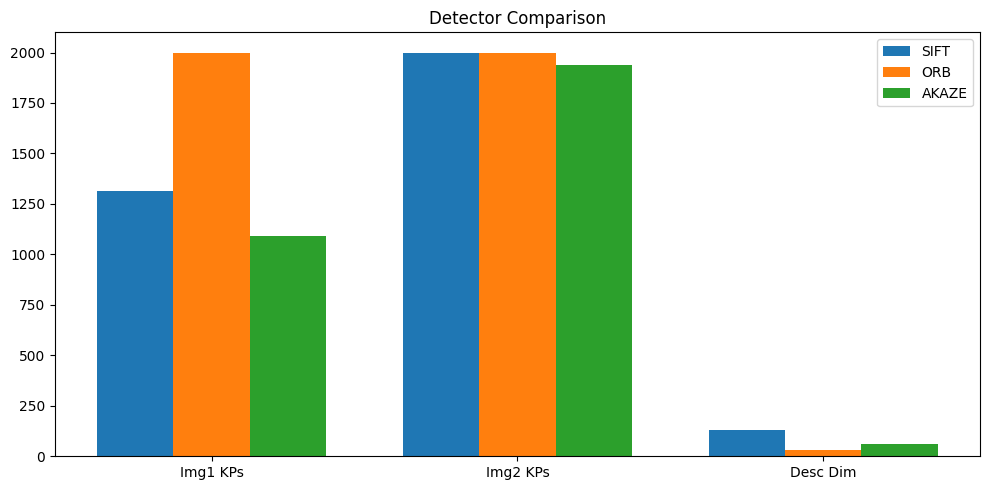

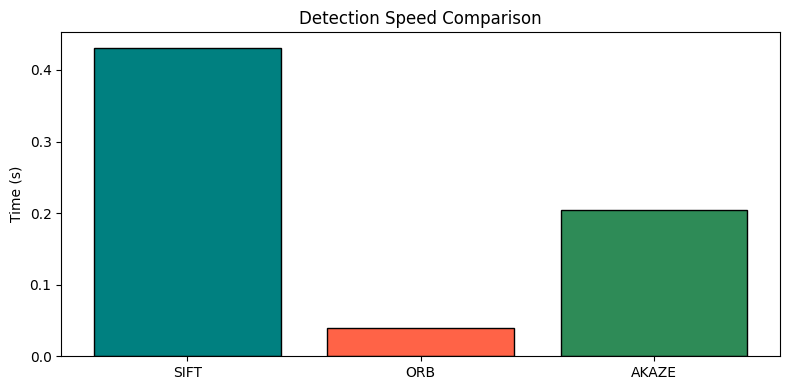

In [32]:
comp_data = {
    'Detector': ['SIFT', 'ORB', 'AKAZE'],
    'Keypoints Img1': [len(kp1_sift), len(kp1_orb), len(kp1_ak)],
    'Keypoints Img2': [len(kp2_sift), len(kp2_orb), len(kp2_ak)],
    'Desc Dim': [128, 32, des1_ak.shape[1]],
    'Time (s)': [round(sift_time, 4), round(orb_time, 4), round(akaze_time, 4)],
}
comp_df = pd.DataFrame(comp_data)
print('Feature Detector Comparison:')
print(comp_df.to_string(index=False))

labels = ['Img1 KPs', 'Img2 KPs', 'Desc Dim']
x = np.arange(len(labels))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 5))
for i, det in enumerate(comp_df['Detector']):
    row = comp_df[comp_df.Detector == det].iloc[0]
    vals = [row['Keypoints Img1'], row['Keypoints Img2'], row['Desc Dim']]
    ax.bar(x + (i - 1) * width, vals, width=width, label=det)

ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_title('Detector Comparison')
ax.legend()
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(comp_df['Detector'], comp_df['Time (s)'], color=['teal', 'tomato', 'seagreen'], edgecolor='black')
ax.set_title('Detection Speed Comparison')
ax.set_ylabel('Time (s)')
plt.tight_layout()
plt.show()

### 4.5 Feature Matching — Brute-Force + Ratio Test

📊 SIFT BF Matching (Lowe ratio=0.75):
   Raw kNN matches: 1316
   Good matches (after ratio test): 79
   Rejection rate: 94.0%


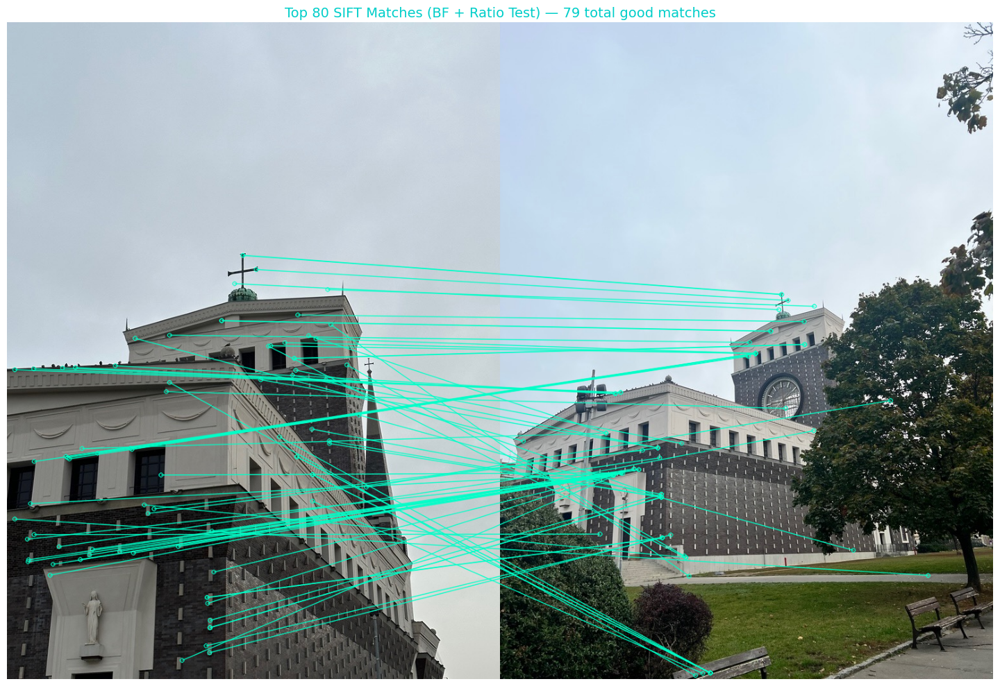

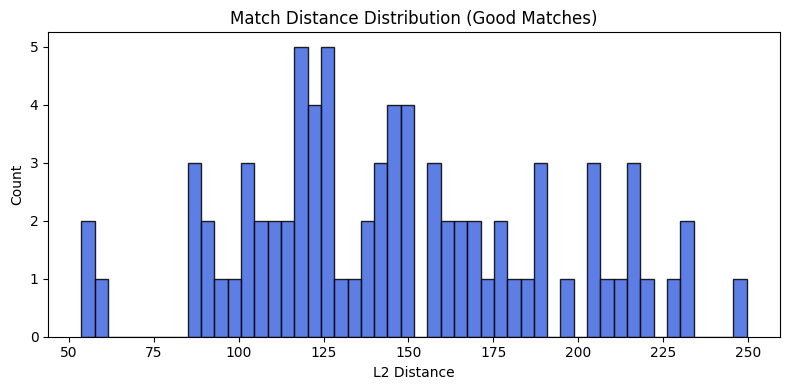

   Distance ? mean: 146.74, median: 143.06, min: 53.61


In [33]:
# SIFT BF matching with ratio test
bf = cv2.BFMatcher(cv2.NORM_L2)
raw_matches = bf.knnMatch(des1_sift, des2_sift, k=2)
good_matches = [m for m, n in raw_matches if m.distance < 0.75 * n.distance]
good_matches = sorted(good_matches, key=lambda x: x.distance)

print(f"📊 SIFT BF Matching (Lowe ratio=0.75):")
print(f"   Raw kNN matches: {len(raw_matches)}")
print(f"   Good matches (after ratio test): {len(good_matches)}")
print(f"   Rejection rate: {100*(1 - len(good_matches)/len(raw_matches)):.1f}%")

# Visualise top matches
match_img = cv2.drawMatches(img1_rgb, kp1_sift, img2_rgb, kp2_sift,
    good_matches[:80], None,
    matchColor=(0, 255, 200), singlePointColor=(255, 100, 50),
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig, ax = plt.subplots(figsize=(22, 10))
ax.imshow(match_img)
ax.set_title(f"Top 80 SIFT Matches (BF + Ratio Test) — {len(good_matches)} total good matches",
             fontsize=14, color="#00cec9")
ax.axis("off")
plt.tight_layout(); plt.show()

# Match distance distribution
dists = [m.distance for m in good_matches]
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(dists, bins=50, color="royalblue", edgecolor="black", alpha=0.85)
ax.set_title("Match Distance Distribution (Good Matches)")
ax.set_xlabel("L2 Distance")
ax.set_ylabel("Count")
plt.tight_layout()
plt.show()
print(f"   Distance ? mean: {np.mean(dists):.2f}, median: {np.median(dists):.2f}, min: {np.min(dists):.2f}")



### 4.6 RANSAC Filtering

📊 RANSAC (USAC_MAGSAC) Results:
   Input matches: 79
   Inliers: 19
   Outliers removed: 60
   Inlier ratio: 24.1%


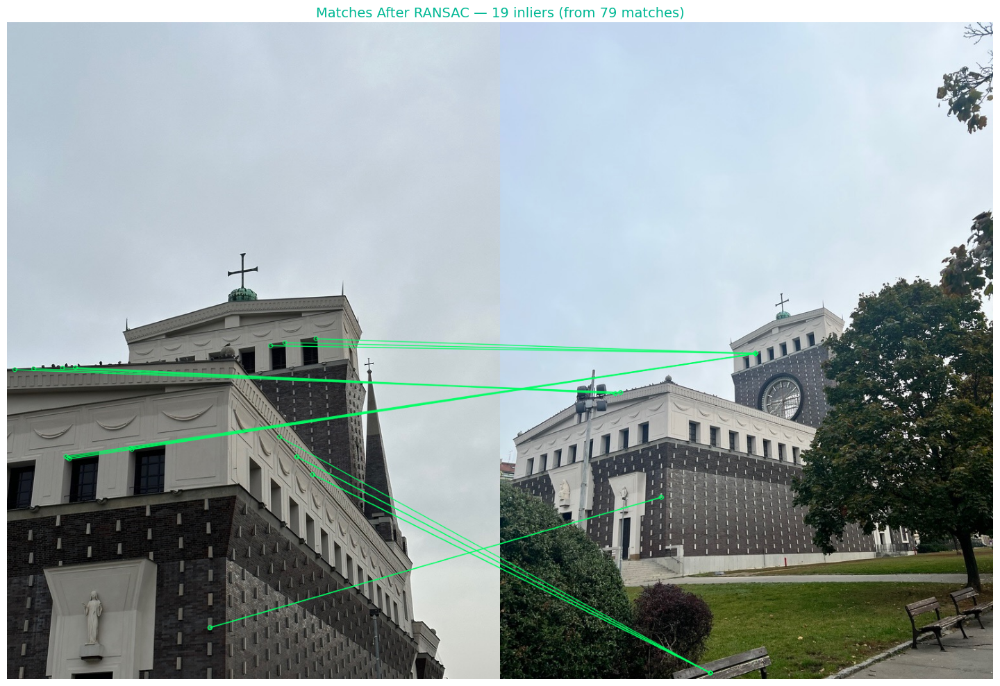

In [34]:
pts1 = np.float32([kp1_sift[m.queryIdx].pt for m in good_matches])
pts2 = np.float32([kp2_sift[m.trainIdx].pt for m in good_matches])

F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.USAC_MAGSAC, 0.5, 0.999, 10000)
inlier_mask = mask.ravel().astype(bool)
inliers = [m for m, flag in zip(good_matches, inlier_mask) if flag]
outliers_count = len(good_matches) - len(inliers)

print(f"📊 RANSAC (USAC_MAGSAC) Results:")
print(f"   Input matches: {len(good_matches)}")
print(f"   Inliers: {len(inliers)}")
print(f"   Outliers removed: {outliers_count}")
print(f"   Inlier ratio: {len(inliers)/len(good_matches)*100:.1f}%")

# Draw inlier matches
inlier_img = cv2.drawMatches(img1_rgb, kp1_sift, img2_rgb, kp2_sift,
    inliers[:80], None,
    matchColor=(0, 255, 100), singlePointColor=(255, 50, 50),
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig, ax = plt.subplots(figsize=(22, 10))
ax.imshow(inlier_img)
ax.set_title(f"Matches After RANSAC — {len(inliers)} inliers (from {len(good_matches)} matches)",
             fontsize=14, color="#00b894")
ax.axis("off")
plt.tight_layout(); plt.show()

### 4.7 Baseline CV Parity Check (SIFT vs ORB)

This parity block mirrors the baseline comparison flow: timing, keypoint counts, and cross-check matching quality for SIFT and ORB.


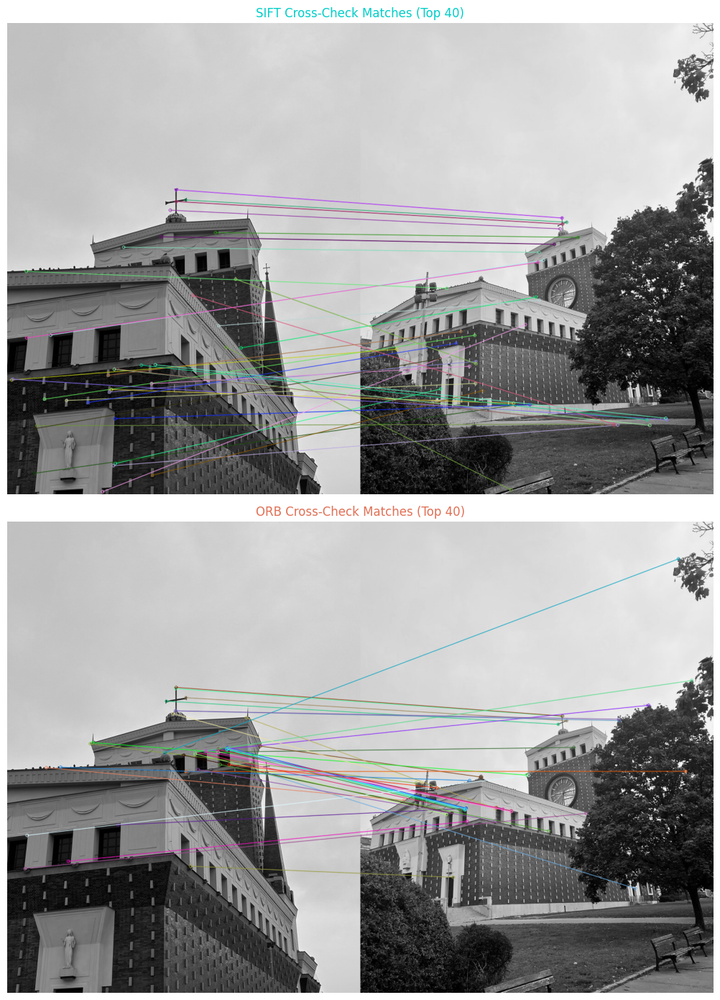

?? Baseline Parity Summary
   SIFT keypoints: img1=1316, img2=2000 | cross-check matches=316 | time=0.4310s
   ORB  keypoints: img1=2000,  img2=2000  | cross-check matches=444  | time=0.0391s


In [35]:
# Baseline parity check using cross-check matchers (same style as baseline assignment)
bf_sift_cc = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
bf_orb_cc = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

sift_cc_matches = sorted(bf_sift_cc.match(des1_sift, des2_sift), key=lambda m: m.distance)
orb_cc_matches = sorted(bf_orb_cc.match(des1_orb, des2_orb), key=lambda m: m.distance)

top_n = 40
sift_cc_vis = cv2.drawMatches(img1_gray, kp1_sift, img2_gray, kp2_sift, sift_cc_matches[:top_n], None, flags=2)
orb_cc_vis = cv2.drawMatches(img1_gray, kp1_orb, img2_gray, kp2_orb, orb_cc_matches[:top_n], None, flags=2)

fig, axes = plt.subplots(2, 1, figsize=(22, 14))
axes[0].imshow(sift_cc_vis, cmap='gray')
axes[0].set_title(f"SIFT Cross-Check Matches (Top {top_n})", color="#00cec9")
axes[0].axis("off")

axes[1].imshow(orb_cc_vis, cmap='gray')
axes[1].set_title(f"ORB Cross-Check Matches (Top {top_n})", color="#e17055")
axes[1].axis("off")

plt.tight_layout()
plt.show()

print("?? Baseline Parity Summary")
print(f"   SIFT keypoints: img1={len(kp1_sift)}, img2={len(kp2_sift)} | cross-check matches={len(sift_cc_matches)} | time={sift_time:.4f}s")
print(f"   ORB  keypoints: img1={len(kp1_orb)},  img2={len(kp2_orb)}  | cross-check matches={len(orb_cc_matches)}  | time={orb_time:.4f}s")


<a id="sec6"></a>
## 5 Camera Calibration, Stereo Vision & Depth

This section follows the baseline CV pipeline with a calibration/undistortion demonstration and a real IMC stereo depth example.


### 5.1 Chessboard Calibration & Undistortion

We include an explicit camera calibration demonstration (corner detection, intrinsic estimation, reprojection error, and undistortion) to complete the baseline CV workflow.


Chessboard corners detected: True


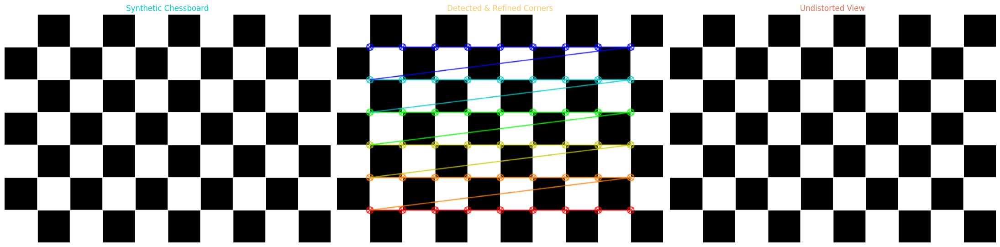

Estimated Intrinsic Matrix K:
[[1.37013023e+07 0.00000000e+00 2.49500000e+02]
 [0.00000000e+00 1.37042517e+07 1.74500010e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion Coefficients:
[ 1.39810227e-06  3.77381690e-16 -6.70708173e-03  6.63495516e-06
  9.54889068e-26]
Reprojection Error: 0.000035


In [36]:
# Synthetic chessboard calibration demo (Kaggle-safe, no external download)
chessboard_size = (9, 6)  # inner corners
sq = 50
rows, cols = chessboard_size[1] + 1, chessboard_size[0] + 1
board_h, board_w = rows * sq, cols * sq

board = np.zeros((board_h, board_w), dtype=np.uint8)
for r in range(rows):
    for c in range(cols):
        if (r + c) % 2 == 0:
            cv2.rectangle(board, (c * sq, r * sq), ((c + 1) * sq, (r + 1) * sq), 255, -1)

ret, corners = cv2.findChessboardCorners(board, chessboard_size, None)
print(f'Chessboard corners detected: {ret}')

if ret:
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    corners_refined = cv2.cornerSubPix(board, corners, (11, 11), (-1, -1), criteria)

    objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
    objp[:, :2] = np.indices(chessboard_size).T.reshape(-1, 2)

    obj_points = [objp]
    img_points = [corners_refined]

    _, K_calib, dist_calib, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, board.shape[::-1], None, None)

    proj, _ = cv2.projectPoints(objp, rvecs[0], tvecs[0], K_calib, dist_calib)
    reproj_err = cv2.norm(corners_refined, proj, cv2.NORM_L2) / len(proj)

    board_bgr = cv2.cvtColor(board, cv2.COLOR_GRAY2BGR)
    board_with_corners = cv2.drawChessboardCorners(board_bgr.copy(), chessboard_size, corners_refined, ret)
    board_undist = cv2.undistort(board_bgr, K_calib, dist_calib)

    fig, axes = plt.subplots(1, 3, figsize=(22, 6))
    axes[0].imshow(board, cmap='gray')
    axes[0].set_title('Synthetic Chessboard', color='#00cec9')
    axes[1].imshow(cv2.cvtColor(board_with_corners, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Detected & Refined Corners', color='#fdcb6e')
    axes[2].imshow(cv2.cvtColor(board_undist, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Undistorted View', color='#e17055')
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    print('Estimated Intrinsic Matrix K:')
    print(K_calib)
    print('Distortion Coefficients:')
    print(dist_calib.ravel())
    print(f'Reprojection Error: {reproj_err:.6f}')
else:
    print('Chessboard detection failed; calibration demo skipped.')

### 5.2 Stereo Disparity & Depth on IMC Pair

Using a real Notre Dame stereo pair from IMC 2024 to estimate disparity and relative depth.


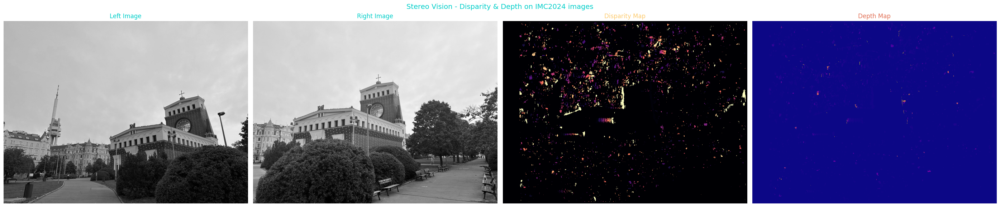

Stereo stats: disparity range [0.5, 63.0]
   Depth range [0.794, 100.000]


In [37]:
# Stereo disparity & depth on another IMC2024 pair
st_scene, st_path1, st_path2, st_cov = choose_demo_pair(preferred_scene=DEFAULT_SCENE, require_pco=False)
if st_path1 is None or st_path2 is None:
    raise RuntimeError('Could not find a second pair for stereo demo.')

left = cv2.imread(st_path1, cv2.IMREAD_GRAYSCALE)
right = cv2.imread(st_path2, cv2.IMREAD_GRAYSCALE)

# Resize to same dimensions for stereo matching
h = min(left.shape[0], right.shape[0])
w = min(left.shape[1], right.shape[1])
left = cv2.resize(left, (w, h))
right = cv2.resize(right, (w, h))

stereo = cv2.StereoBM_create(numDisparities=64, blockSize=15)
disparity = stereo.compute(left, right).astype(np.float32) / 16.0

# Depth from disparity
focal_length = 500
baseline = 0.1
depth = np.zeros_like(disparity)
valid = disparity > 0
depth[valid] = (focal_length * baseline) / disparity[valid]
depth_norm = cv2.normalize(depth, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

fig, axes = plt.subplots(1, 4, figsize=(28, 6))
axes[0].imshow(left, cmap='gray'); axes[0].set_title('Left Image', color='#00cec9')
axes[1].imshow(right, cmap='gray'); axes[1].set_title('Right Image', color='#00cec9')
axes[2].imshow(disparity, cmap='magma'); axes[2].set_title('Disparity Map', color='#fdcb6e')
axes[3].imshow(depth_norm, cmap='plasma'); axes[3].set_title('Depth Map', color='#e17055')
for ax in axes:
    ax.axis('off')
fig.suptitle('Stereo Vision - Disparity & Depth on IMC2024 images', fontsize=14, color='#00cec9')
plt.tight_layout()
plt.show()

if np.any(valid):
    print(f'Stereo stats: disparity range [{disparity[valid].min():.1f}, {disparity[valid].max():.1f}]')
    print(f'   Depth range [{depth[valid].min():.3f}, {depth[valid].max():.3f}]')
else:
    print('No valid disparity points found for this pair.')

<a id="sec7"></a>
## 6 Fundamental & Essential Matrices ? Epipolar Geometry

### 6.1 SIFT-Based Epipolar Geometry


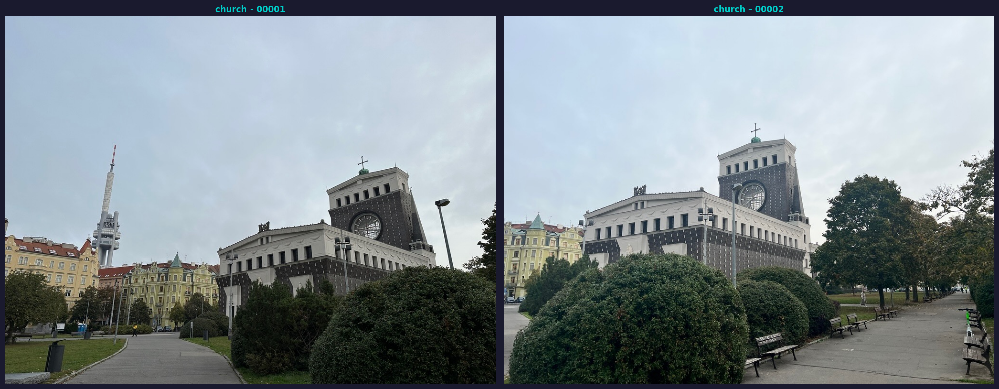

Fundamental Matrix Estimation (church):
   Matches: 1740, Inliers: 131
   F matrix:
[[ 3.31426772e-07  3.03744991e-06 -1.17396754e-03]
 [-1.18672812e-06  8.65449008e-07  5.02150027e-03]
 [-3.88129599e-04 -6.35914570e-03  1.17962880e+00]]


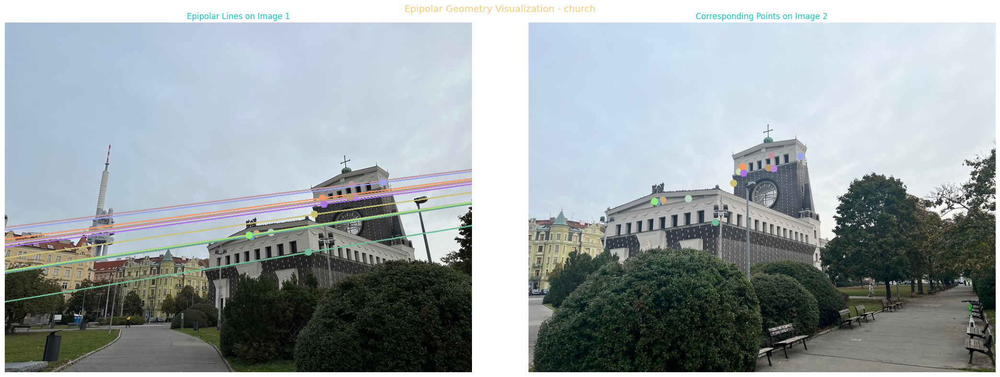

Skipping essential matrix: intrinsics unavailable for this pair.


In [38]:
# SIFT-based epipolar geometry demo on IMC2024 pair
scene = DEFAULT_SCENE if DEFAULT_SCENE in train_map else (TRAIN_SCENES[0] if TRAIN_SCENES else None)
if scene is None:
    raise RuntimeError('No scenes available in train_map.')

pco_scene = train_map[scene]['pco_df']
if len(pco_scene):
    demo_row = pco_scene.iloc[min(850, len(pco_scene) - 1)]
    d_id1, d_id2 = str(demo_row.image_id_1), str(demo_row.image_id_2)
    p1, p2 = demo_row.image_path_1, demo_row.image_path_2
else:
    imgs = train_map[scene]['images']
    if len(imgs) < 2:
        raise RuntimeError(f'Not enough images in scene {scene} for epipolar demo.')
    p1, p2 = imgs[0], imgs[1]
    d_id1 = os.path.splitext(os.path.basename(p1))[0]
    d_id2 = os.path.splitext(os.path.basename(p2))[0]

d_img1 = cv2.imread(p1, cv2.IMREAD_GRAYSCALE)
d_img2 = cv2.imread(p2, cv2.IMREAD_GRAYSCALE)
d_rgb1 = cv2.cvtColor(cv2.imread(p1), cv2.COLOR_BGR2RGB)
d_rgb2 = cv2.cvtColor(cv2.imread(p2), cv2.COLOR_BGR2RGB)

plot_image_pair(p1, p2, [f'{scene} - {d_id1}', f'{scene} - {d_id2}'])

# Detect + Match + RANSAC
sift_d = cv2.SIFT_create(5000, contrastThreshold=-10000, edgeThreshold=-10000)
kp1d, des1d = sift_d.detectAndCompute(d_img1, None)
kp2d, des2d = sift_d.detectAndCompute(d_img2, None)
bf_d = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches_d = sorted(bf_d.match(des1d, des2d), key=lambda x: x.distance)

pts1d = np.float32([kp1d[m.queryIdx].pt for m in matches_d])
pts2d = np.float32([kp2d[m.trainIdx].pt for m in matches_d])

F_pred, mask_d = cv2.findFundamentalMat(pts1d, pts2d, cv2.USAC_MAGSAC, 0.25, 0.99999, 10000)
inl_mask = mask_d.ravel().astype(bool)

print(f'Fundamental Matrix Estimation ({scene}):')
print(f'   Matches: {len(matches_d)}, Inliers: {inl_mask.sum()}')
print('   F matrix:')
print(F_pred)

# Draw epipolar lines
pts1_inl = pts1d[inl_mask]
pts2_inl = pts2d[inl_mask]
lines1 = cv2.computeCorrespondEpilines(pts2_inl[:15].reshape(-1, 1, 2), 2, F_pred).reshape(-1, 3)
epi1 = d_rgb1.copy()
epi2 = d_rgb2.copy()
for line, pt1, pt2 in zip(lines1, pts1_inl[:15], pts2_inl[:15]):
    c = tuple(np.random.randint(100, 255, 3).tolist())
    if abs(line[1]) < 1e-6:
        continue
    x0, y0 = 0, int(-line[2] / line[1])
    x1, y1 = d_img1.shape[1], int(-(line[2] + line[0] * d_img1.shape[1]) / line[1])
    epi1 = cv2.line(epi1, (x0, y0), (x1, y1), c, 2)
    epi1 = cv2.circle(epi1, tuple(np.int32(pt1)), 8, c, -1)
    epi2 = cv2.circle(epi2, tuple(np.int32(pt2)), 8, c, -1)

fig, axes = plt.subplots(1, 2, figsize=(22, 8))
axes[0].imshow(epi1); axes[0].set_title('Epipolar Lines on Image 1', color='#00cec9')
axes[1].imshow(epi2); axes[1].set_title('Corresponding Points on Image 2', color='#00cec9')
for ax in axes:
    ax.axis('off')
fig.suptitle(f'Epipolar Geometry Visualization - {scene}', fontsize=14, color='#fdcb6e')
plt.tight_layout()
plt.show()

# Essential matrix if intrinsics are available
K1 = id2cal.get(d_id1, {}).get('K')
K2 = id2cal.get(d_id2, {}).get('K')
if isinstance(K1, np.ndarray) and K1.shape == (3, 3) and isinstance(K2, np.ndarray) and K2.shape == (3, 3):
    E = K2.T @ F_pred @ K1
    print('Essential Matrix:')
    print(E)
else:
    print('Skipping essential matrix: intrinsics unavailable for this pair.')

### 6.2 ORB + RANSAC Epipolar Geometry

This ORB block mirrors the baseline assignment flow and visualizes epipolar lines from ORB correspondences with RANSAC filtering.


ORB + RANSAC Results
   Scene: church
   Total matches: 1403
   Inliers: 553
   Fundamental Matrix:
[[ 2.10965242e-07 -2.20386760e-07  4.77874161e-04]
 [ 1.67059545e-06  3.28104547e-07  1.93549659e-03]
 [-1.44570897e-03 -3.28387636e-03  1.00000000e+00]]


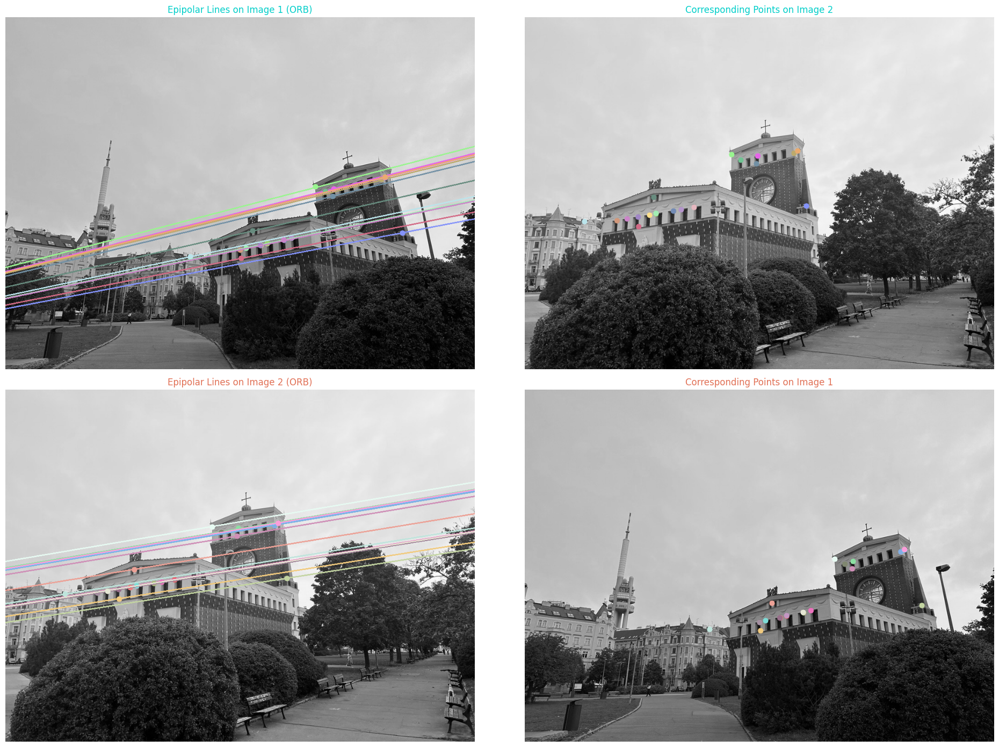

In [39]:
# ORB + RANSAC fundamental matrix and epipolar line visualization on IMC2024 pair
orb_e = cv2.ORB_create(nfeatures=5000)

scene_e, nd_path1, nd_path2, _ = choose_demo_pair(preferred_scene=DEFAULT_SCENE, require_pco=False)
if nd_path1 is None or nd_path2 is None:
    raise RuntimeError('No valid pair available for ORB epipolar demo.')

nd1 = cv2.imread(nd_path1, cv2.IMREAD_GRAYSCALE)
nd2 = cv2.imread(nd_path2, cv2.IMREAD_GRAYSCALE)
nd1_rgb = cv2.cvtColor(cv2.imread(nd_path1), cv2.COLOR_BGR2RGB)
nd2_rgb = cv2.cvtColor(cv2.imread(nd_path2), cv2.COLOR_BGR2RGB)

kp1_e, des1_e = orb_e.detectAndCompute(nd1, None)
kp2_e, des2_e = orb_e.detectAndCompute(nd2, None)

bf_e = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches_e = sorted(bf_e.match(des1_e, des2_e), key=lambda x: x.distance)

pts1_e = np.float32([kp1_e[m.queryIdx].pt for m in matches_e])
pts2_e = np.float32([kp2_e[m.trainIdx].pt for m in matches_e])

F_orb, m_orb = cv2.findFundamentalMat(pts1_e, pts2_e, cv2.FM_RANSAC)
if F_orb is None or F_orb.shape != (3, 3):
    raise RuntimeError('ORB fundamental matrix estimation failed')

inl = m_orb.ravel().astype(bool)
pts1_in = pts1_e[inl]
pts2_in = pts2_e[inl]

print('ORB + RANSAC Results')
print(f'   Scene: {scene_e}')
print(f'   Total matches: {len(matches_e)}')
print(f'   Inliers: {inl.sum()}')
print('   Fundamental Matrix:')
print(F_orb)

def draw_epilines(imgA_gray, imgB_gray, lines, ptsA, ptsB):
    h, w = imgA_gray.shape
    imgA = cv2.cvtColor(imgA_gray, cv2.COLOR_GRAY2RGB)
    imgB = cv2.cvtColor(imgB_gray, cv2.COLOR_GRAY2RGB)
    for line, pA, pB in zip(lines, ptsA, ptsB):
        color = tuple(np.random.randint(100, 255, 3).tolist())
        if abs(line[1]) < 1e-6:
            continue
        x0, y0 = 0, int(-line[2] / line[1])
        x1, y1 = w, int(-(line[2] + line[0] * w) / line[1])
        imgA = cv2.line(imgA, (x0, y0), (x1, y1), color, 2)
        imgA = cv2.circle(imgA, tuple(np.int32(pA)), 6, color, -1)
        imgB = cv2.circle(imgB, tuple(np.int32(pB)), 6, color, -1)
    return imgA, imgB

n_show = min(20, len(pts1_in))
lines_on_1 = cv2.computeCorrespondEpilines(pts2_in[:n_show].reshape(-1, 1, 2), 2, F_orb).reshape(-1, 3)
lines_on_2 = cv2.computeCorrespondEpilines(pts1_in[:n_show].reshape(-1, 1, 2), 1, F_orb).reshape(-1, 3)

epi1, pts_on_2 = draw_epilines(nd1, nd2, lines_on_1, pts1_in[:n_show], pts2_in[:n_show])
epi2, pts_on_1 = draw_epilines(nd2, nd1, lines_on_2, pts2_in[:n_show], pts1_in[:n_show])

fig, axes = plt.subplots(2, 2, figsize=(20, 14))
axes[0, 0].imshow(epi1)
axes[0, 0].set_title('Epipolar Lines on Image 1 (ORB)', color='#00cec9')
axes[0, 1].imshow(pts_on_2)
axes[0, 1].set_title('Corresponding Points on Image 2', color='#00cec9')
axes[1, 0].imshow(epi2)
axes[1, 0].set_title('Epipolar Lines on Image 2 (ORB)', color='#e17055')
axes[1, 1].imshow(pts_on_1)
axes[1, 1].set_title('Corresponding Points on Image 1', color='#e17055')
for ax in axes.ravel():
    ax.axis('off')
plt.tight_layout()
plt.show()

<a id="sec8"></a>
## 7 SfM Pipeline Overview & Key Takeaways

### Structure from Motion Pipeline
```
Raw Images ? Camera Calibration/Undistortion ? Feature Detection (SIFT/ORB/AKAZE)
? Feature Matching (BF/FLANN) ? RANSAC Outlier Rejection ? Fundamental Matrix
? Essential Matrix ? Pose Recovery (R, T) ? 3D Reconstruction
```

### Key Insights from this Notebook

| Finding | Detail |
|:--------|:-------|
| **Dataset** | 16 scenes, ~200-800 images each; images resized to ~800px longest edge |
| **Covisibility** | Threshold ? 0.1 recommended; varies significantly across scenes |
| **Calibration Demo** | Chessboard corner detection + intrinsic estimation + undistortion included |
| **SIFT** | Most robust classical detector; 128-D descriptors; strong geometric consistency |
| **ORB** | Fast detector with binary descriptors; effective with Hamming + RANSAC filtering |
| **AKAZE** | Non-linear scale space; handles texture variation well |
| **Stereo** | Disparity and depth visualization on real IMC pair included |
| **Epipolar Geometry** | Both SIFT-based and ORB-based epipolar line visualizations are included |
| **RANSAC** | Robust estimation is critical for reliable F-matrix recovery |
